NOTEBOOK DESTINADO AL SAMPLEAMINENTO DE DATOS ADECUADOS PARA ENTRENAR EL MODELO

In [136]:
import tensorflow as tf
import numpy as np
import os
from pycocotools.coco import COCO
import cv2
import matplotlib.pyplot as plt

from utils import save_numpy_array

In [73]:
# Paths to COCO dataset
instances_val = r"..\datasets\coco"

COCO_PATH = instances_val
TRAIN_IMAGES_PATH = os.path.join(COCO_PATH, 'images', 'val2017')
ANNOTATIONS_PATH = os.path.join(COCO_PATH, 'annotations', 'instances_val2017.json')
OUTPUT_FILES =  os.path.join(COCO_PATH, 'preprocessed', 'val2017')   

OUTPUT_PATH = os.path.abspath(OUTPUT_FILES)

In [74]:
# Initialize COCO
coco = COCO(ANNOTATIONS_PATH)

# Step 1: Analyze Class Representation and Get Top 5 Classes
category_counts = {}
for ann in coco.dataset['annotations']:
    cat_id = ann['category_id']
    category_counts[cat_id] = category_counts.get(cat_id, 0) + 1

# Get category names
categories = {cat['id']: cat['name'] for cat in coco.dataset['categories']}

# Get the top 5 categories
sorted_categories = sorted(category_counts.items(), key=lambda x: x[1], reverse=True)
top_10_categories = sorted_categories[:10]
top_10_category_ids = [cat[0] for cat in top_10_categories]

print("Top 10 Categories:", [categories[cat_id] for cat_id in top_10_category_ids])

loading annotations into memory...
Done (t=3.53s)
creating index...
index created!
Top 10 Categories: ['person', 'car', 'chair', 'book', 'bottle', 'cup', 'dining table', 'traffic light', 'bowl', 'handbag']


Nuestro objetivo en este caso sera recuperar las mascaras separadas en 10 canales por cada una de las 10 clases que hay en imagen, y en este caso amacenarlas como numpy array de 10 canales en memoria para que las necesidades de memoria sean menores, al ser necesario un almacenamiento de una gran cantidad de canales.


Es por ello que usamos la función `save_numpy_array`, definida en nuestro script `utils.py`, que almacena los datos como npz en la carpeta de datos preprocesados, que en este caso es `data\preprocessed_train`

In [75]:

def mask_generator(class_id,image_id, display = True):
    coco = COCO(ANNOTATIONS_PATH)

    ann_ids = coco.getAnnIds(imgIds=image_id, catIds=[class_id], iscrowd=None)

    image_info = coco.loadImgs(image_id)[0]

    height, width = image_info['height'], image_info['width']

    img_path = os.path.join(TRAIN_IMAGES_PATH,  image_info['file_name'])

    composite_mask  = np.zeros((height, width), dtype=np.uint8)

    if not ann_ids:
        # Reporesentamos (mascara vacía)
        if(display):
            original_image = cv2.imread(img_path)
            original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)        
            _ , axs = plt.subplots(1, 2, figsize=(10, 5))
            axs[0].imshow(original_image)
            axs[0].axis('off')
            axs[0].set_title('Imagen')
            
            axs[1].imshow(composite_mask, cmap='gray')
            axs[1].axis('off')
            axs[1].set_title('Máscara agrupando por clase')
            plt.show()        
        return composite_mask

   

    for ann in ann_ids:

        ann = coco.loadAnns(ann)[0]

        #print(ann)
           
        mask = coco.annToMask(ann)
        composite_mask = np.maximum(composite_mask, mask * 255)
    
    # Ahora representamos de forma gráfica de forma opcional

    if(display):
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)        
        _ , axs = plt.subplots(1, 2, figsize=(10, 5))
        axs[0].imshow(original_image)
        axs[0].axis('off')
        axs[0].set_title('Imagen')
        
        axs[1].imshow(composite_mask, cmap='gray')
        axs[1].axis('off')
        axs[1].set_title('Máscara agrupando por clase')
        plt.show()

    # La máscara la devolvemsos para guardarla como np array
    return composite_mask


Iteramos por cada una de las 10 clases más representadas, generando las máscaras equivalentes, en primera instancia representando de forma gráfica sin hacer nada para visualizar los resultados.

img_id: 425226
Dentro de la clase person
loading annotations into memory...
Done (t=1.37s)
creating index...
index created!


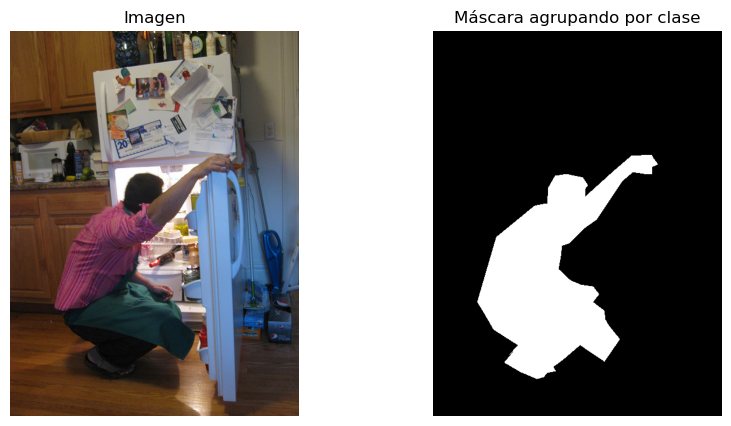

img_id: 508602
Dentro de la clase car
loading annotations into memory...
Done (t=0.73s)
creating index...
index created!


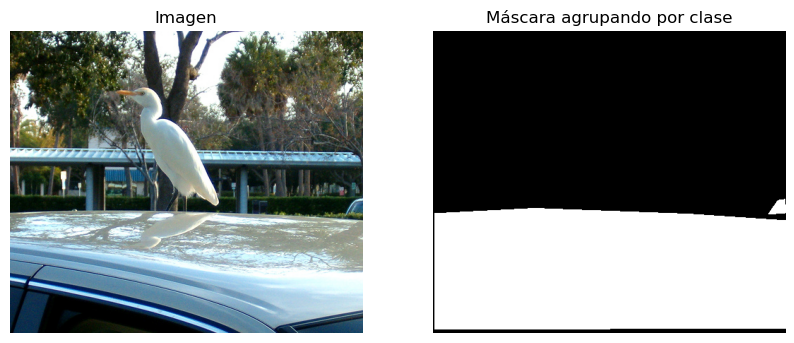

img_id: 186980
Dentro de la clase chair
loading annotations into memory...
Done (t=1.13s)
creating index...
index created!


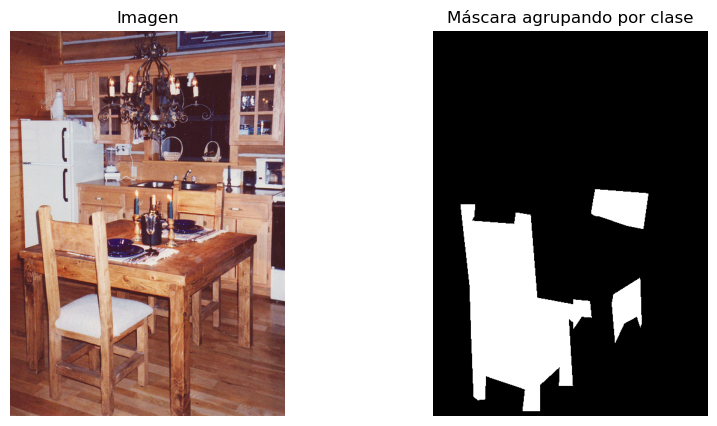

img_id: 211825
Dentro de la clase book
loading annotations into memory...
Done (t=1.22s)
creating index...
index created!


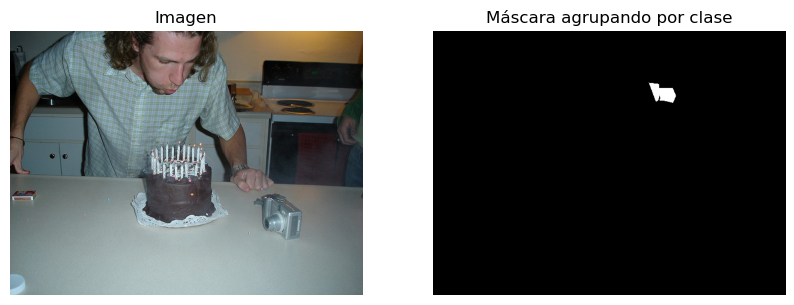

img_id: 117914
Dentro de la clase bottle
loading annotations into memory...
Done (t=1.10s)
creating index...
index created!


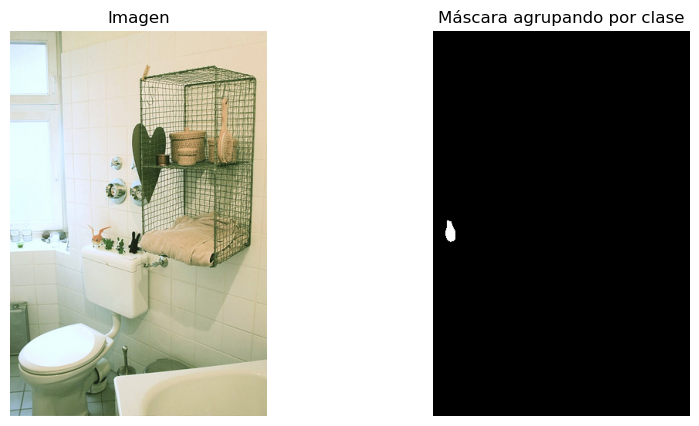

img_id: 501523
Dentro de la clase cup
loading annotations into memory...
Done (t=1.13s)
creating index...
index created!


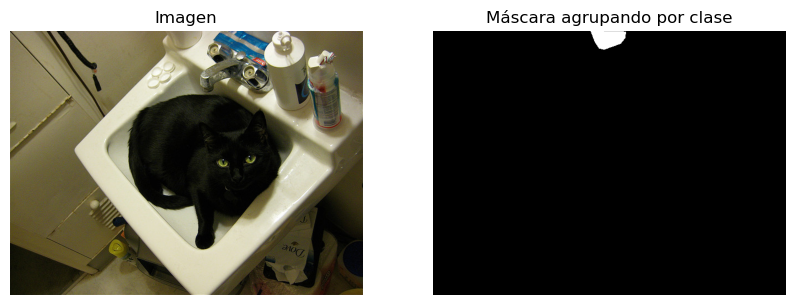

img_id: 216497
Dentro de la clase dining table
loading annotations into memory...
Done (t=0.77s)
creating index...
index created!


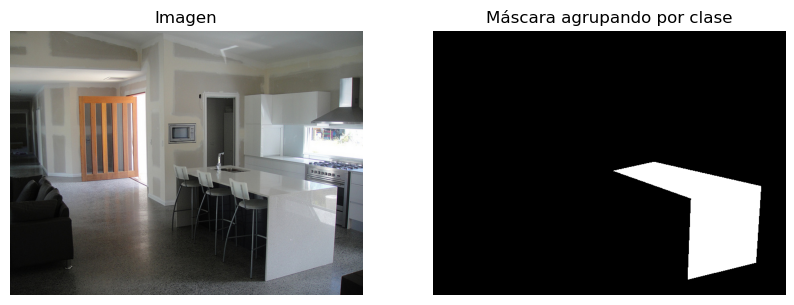

img_id: 228942
Dentro de la clase traffic light
loading annotations into memory...
Done (t=1.02s)
creating index...
index created!


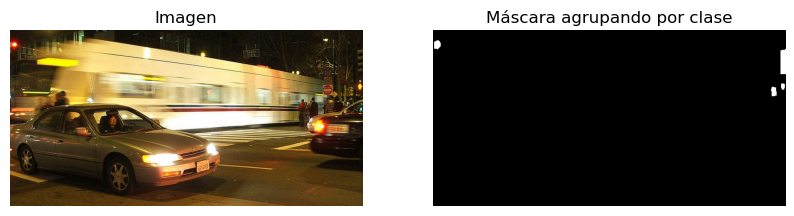

img_id: 575970
Dentro de la clase bowl
loading annotations into memory...
Done (t=1.15s)
creating index...
index created!


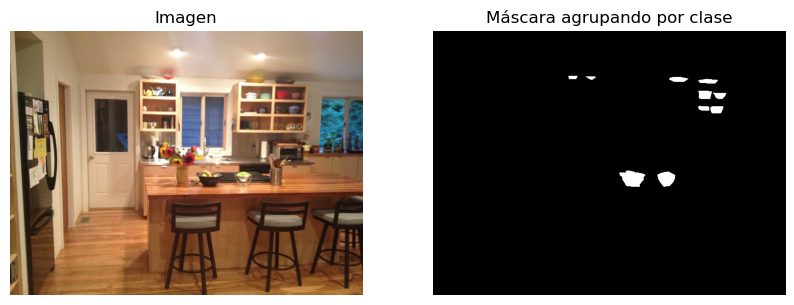

img_id: 349184
Dentro de la clase handbag
loading annotations into memory...
Done (t=1.25s)
creating index...
index created!


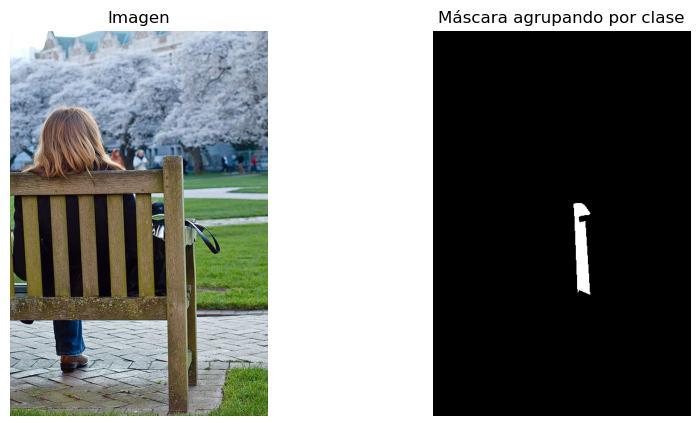

In [76]:

for cat in top_10_category_ids:
    ann_ids = coco.getAnnIds(catIds=[cat])
    first_ann = coco.loadAnns(ann_ids[0])[0]
    image_id = first_ann['image_id']
    # print("cat", cat)
    print("img_id:",image_id)

    print(f"Dentro de la clase {categories[cat]}")

    mask = mask_generator(cat, image_id)
    

Comprobamos que el método devuelve una máscara vacia para la imagen con `image_Id` 508602 para `class_Id` de 1, que se corresponde con persona, para comprobar que las dimensiones de la máscara son las correctas:

loading annotations into memory...
Done (t=1.33s)
creating index...
index created!


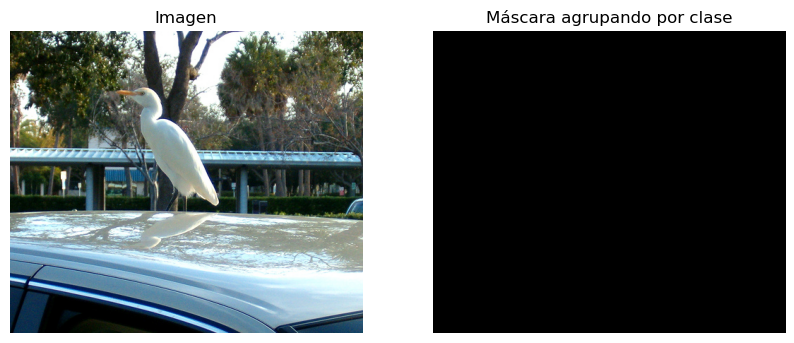

In [77]:

cat = 1
image_id = 508602

mask = mask_generator(cat, image_id)



Ahora buscamos elementos con máscaras de los elementos  ['person', 'car',  'traffic light'] al mimso tiempo para estudiar si se generan de forma correcta los n canales con las máscaras adecuadas

In [78]:

print("Las categorias y su id más representadas son: ", [(categories[cat_id], cat_id) for cat_id in top_10_category_ids])


Las categorias y su id más representadas son:  [('person', 1), ('car', 3), ('chair', 62), ('book', 84), ('bottle', 44), ('cup', 47), ('dining table', 67), ('traffic light', 10), ('bowl', 51), ('handbag', 31)]


In [79]:
class_ids = [1, 10, 3]


img_ids = set(coco.getImgIds(catIds=class_ids[0]))

for cat in class_ids[1:]:
    img_ids &= set(coco.getImgIds(catIds=cat))

img_ids = list(img_ids)


print(f"Las imagenes con las 3 clases coindicentes son  {len(img_ids)}")

Las imagenes con las 3 clases coindicentes son  76


Por último, en primera instancia seleccionamos imágenes de train que contengan las n clases más representadas

In [80]:

def mask_generator(class_id,image_id, display = True):
    coco = COCO(ANNOTATIONS_PATH)

    ann_ids = coco.getAnnIds(imgIds=image_id, catIds=[class_id], iscrowd=None)

    image_info = coco.loadImgs(image_id)[0]

    height, width = image_info['height'], image_info['width']

    img_path = os.path.join(TRAIN_IMAGES_PATH,  image_info['file_name'])

    composite_mask  = np.zeros((height, width), dtype=np.uint8)

    if not ann_ids:
        # Reporesentamos (mascara vacía)
        if(display):
            original_image = cv2.imread(img_path)
            original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)        
            _ , axs = plt.subplots(1, 2, figsize=(10, 5))
            axs[0].imshow(original_image)
            axs[0].axis('off')
            axs[0].set_title('Imagen')
            
            axs[1].imshow(composite_mask, cmap='gray')
            axs[1].axis('off')
            axs[1].set_title('Máscara agrupando por clase')
            plt.show()        
        return composite_mask

   

    for ann in ann_ids:

        ann = coco.loadAnns(ann)[0]

        #print(ann)
           
        mask = coco.annToMask(ann)
        composite_mask = np.maximum(composite_mask, mask * 255)
    
    # Ahora representamos de forma gráfica de forma opcional (segun el parametro pasado  )

    if(display):
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)        
        _ , axs = plt.subplots(1, 2, figsize=(10, 5))
        axs[0].imshow(original_image)
        axs[0].axis('off')
        axs[0].set_title('Imagen')
        
        axs[1].imshow(composite_mask, cmap='gray')
        axs[1].axis('off')
        axs[1].set_title('Máscara agrupando por clase')
        plt.show()

    # La máscara la devolvemsos para guardarla como np array
    return composite_mask


Visualizamos solo las 3 primeras máscaras

Representando person
loading annotations into memory...
Done (t=0.90s)
creating index...
index created!


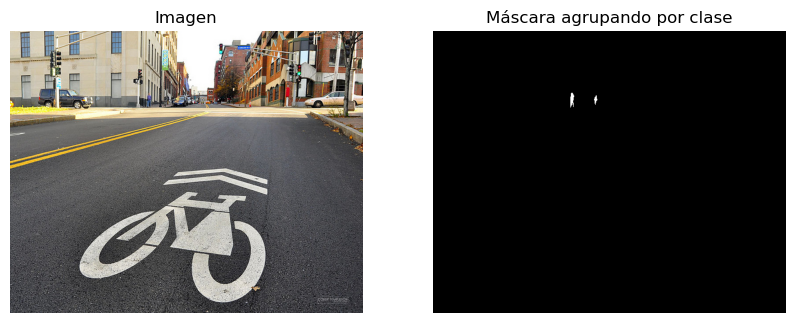

Representando person
loading annotations into memory...
Done (t=1.14s)
creating index...
index created!


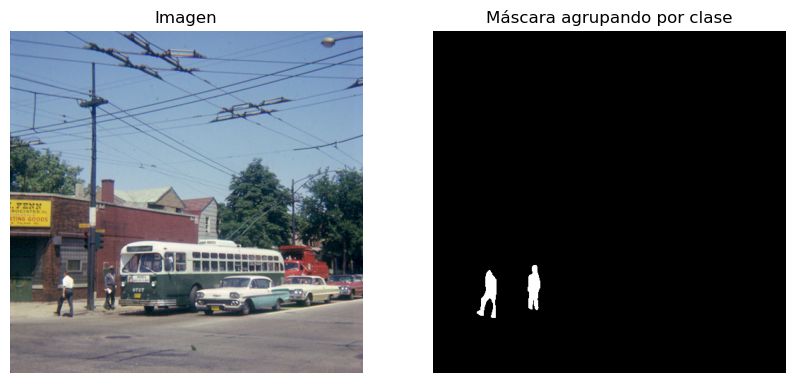

Representando person
loading annotations into memory...
Done (t=1.09s)
creating index...
index created!


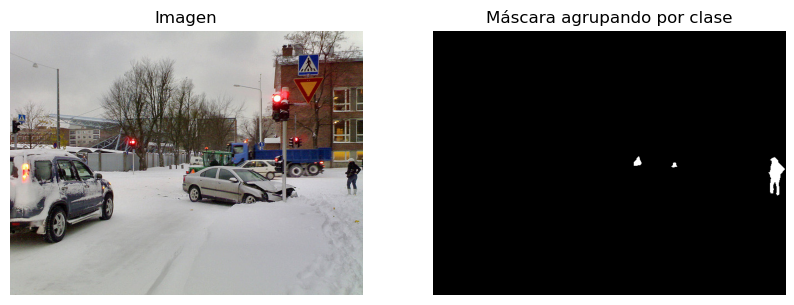

Representando traffic light
loading annotations into memory...
Done (t=1.34s)
creating index...
index created!


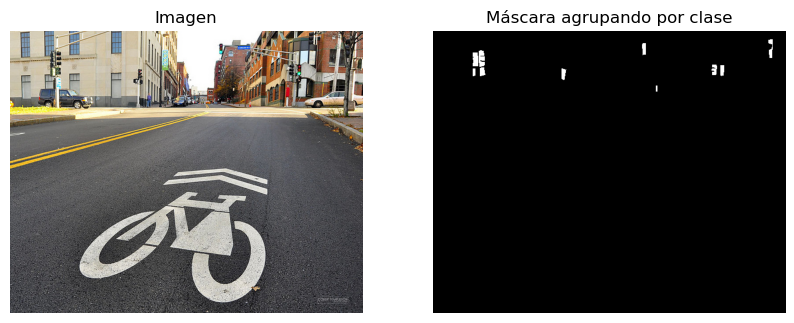

Representando traffic light
loading annotations into memory...
Done (t=1.36s)
creating index...
index created!


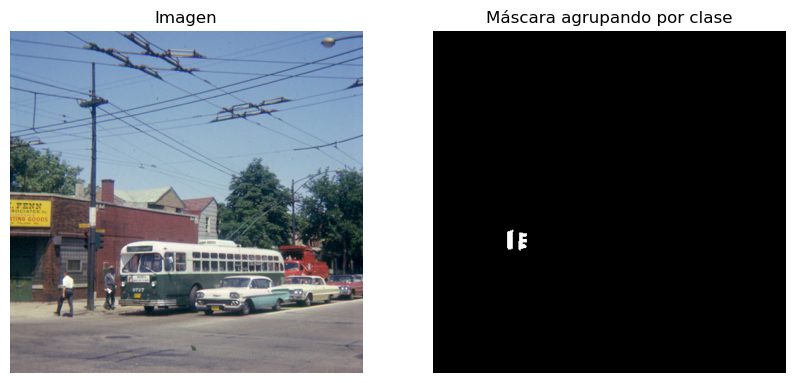

Representando traffic light
loading annotations into memory...
Done (t=0.75s)
creating index...
index created!


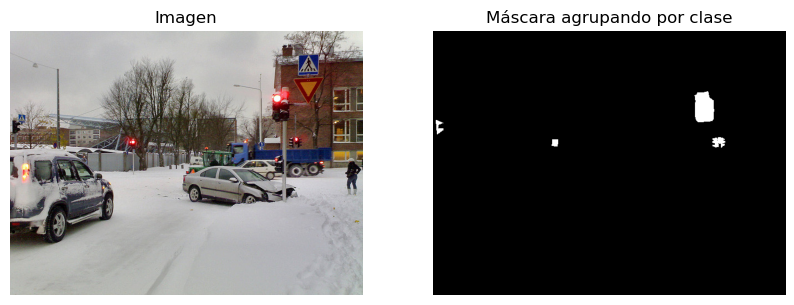

Representando car
loading annotations into memory...
Done (t=1.23s)
creating index...
index created!


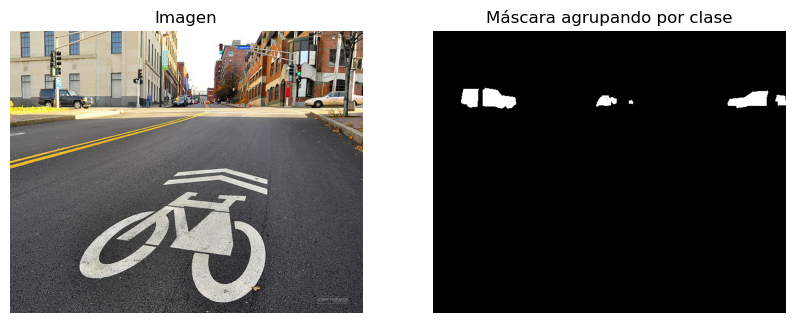

Representando car
loading annotations into memory...
Done (t=1.10s)
creating index...
index created!


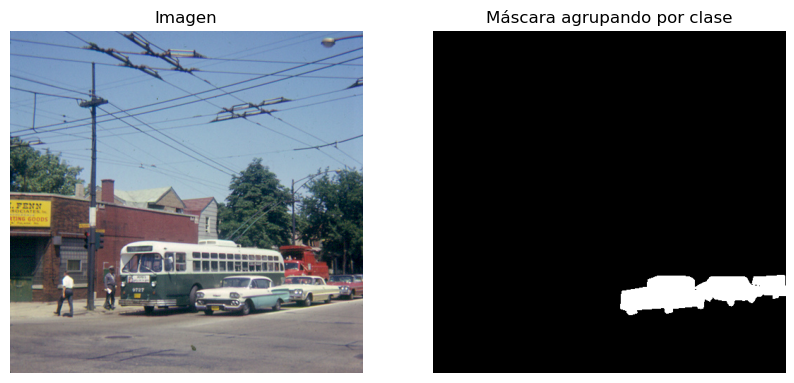

Representando car
loading annotations into memory...
Done (t=1.37s)
creating index...
index created!


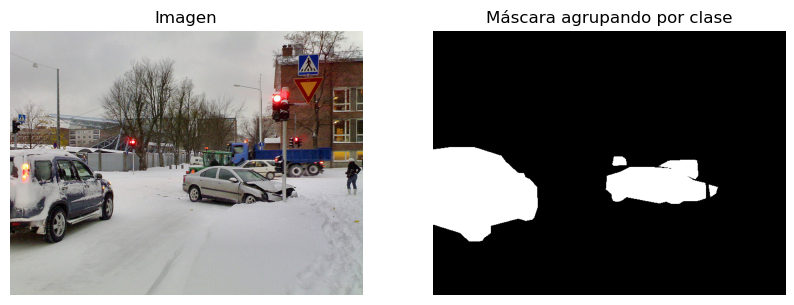

In [81]:
for clase in class_ids:
    for image in img_ids[:3]:
        print(f"Representando {categories[clase]}")
        mask = mask_generator(clase, image)

De las imágenes obtenidas, generamos las máscaras y las almacenamos en memoria

In [82]:


def mask_generator(class_id,image_id, display = True, threshold = 200):

    ann_ids = coco.getAnnIds(imgIds=image_id, catIds=[class_id], iscrowd=None)

    image_info = coco.loadImgs(image_id)[0]

    height, width = image_info['height'], image_info['width']

    img_path = os.path.join(TRAIN_IMAGES_PATH,  image_info['file_name'])

    composite_mask  = np.zeros((height, width), dtype=np.uint8)

    if not ann_ids:
        # Reporesentamos (mascara vacía)
        if(display):
            original_image = cv2.imread(img_path)
            original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)        
            _ , axs = plt.subplots(1, 2, figsize=(10, 5))
            axs[0].imshow(original_image)
            axs[0].axis('off')
            axs[0].set_title('Imagen')
            
            axs[1].imshow(composite_mask, cmap='gray')
            axs[1].axis('off')
            axs[1].set_title('Máscara agrupando por clase')
            plt.show()        
        return composite_mask

   

    for ann in ann_ids:

        ann = coco.loadAnns(ann)[0]

        #print(ann)
           
        mask = coco.annToMask(ann)

        #print(f"Tamaño de la mascara {np.sum(mask)}")

        # Control de elementos demasiado pequeños de cara a generar el ground truth
        
        if(np.sum(mask)>threshold):
            composite_mask = np.maximum(composite_mask, mask * 255)
    
    # Ahora representamos de forma gráfica de forma opcional (segun el parametro pasado  )

    if(display):
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)        
        _ , axs = plt.subplots(1, 2, figsize=(10, 5))
        axs[0].imshow(original_image)
        axs[0].axis('off')
        axs[0].set_title('Imagen')
        
        axs[1].imshow(composite_mask, cmap='gray')
        axs[1].axis('off')
        axs[1].set_title('Máscara agrupando por clase')
        plt.show()

    # La máscara la devolvemsos para guardarla como np array
    return composite_mask


Representando person


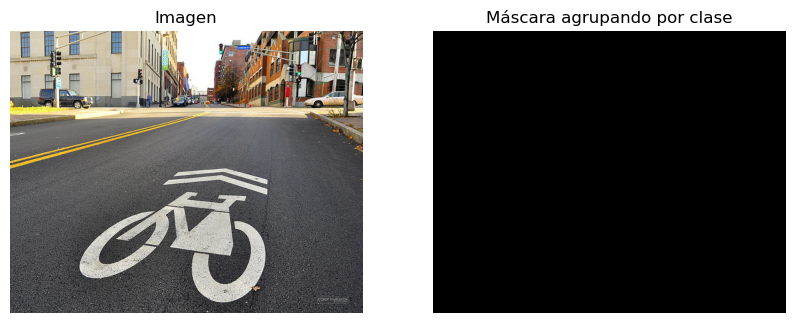

Representando person


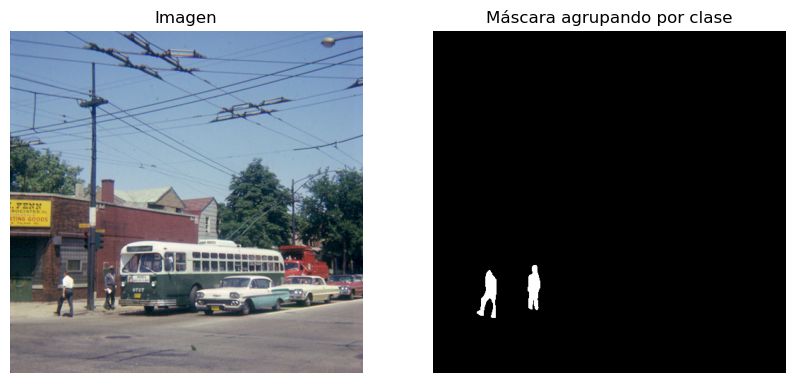

Representando person


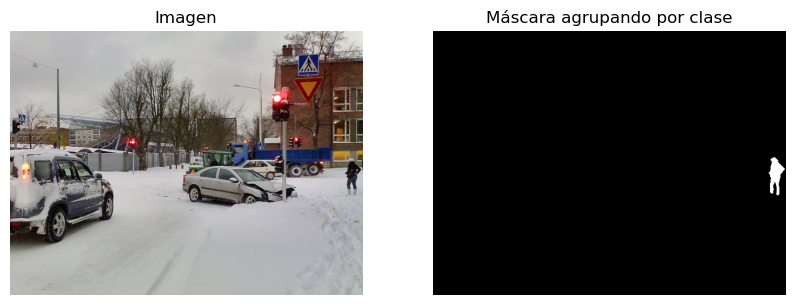

Representando traffic light


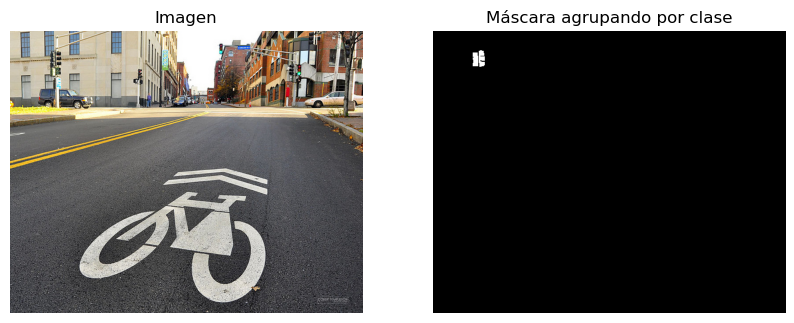

Representando traffic light


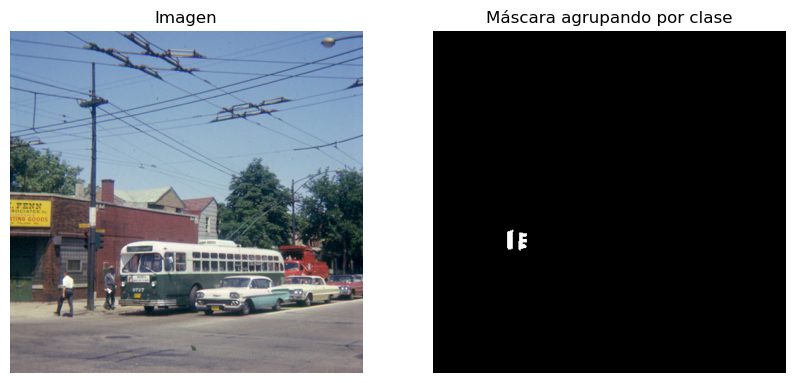

Representando traffic light


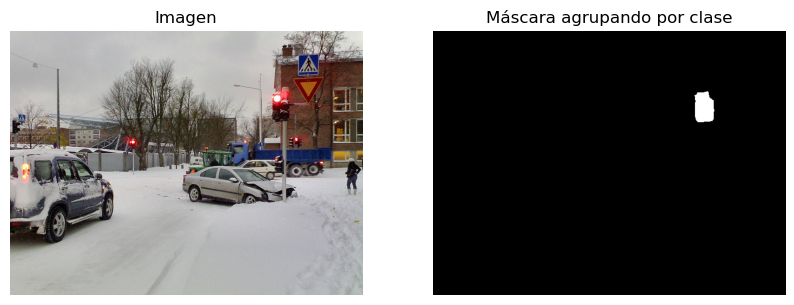

Representando car


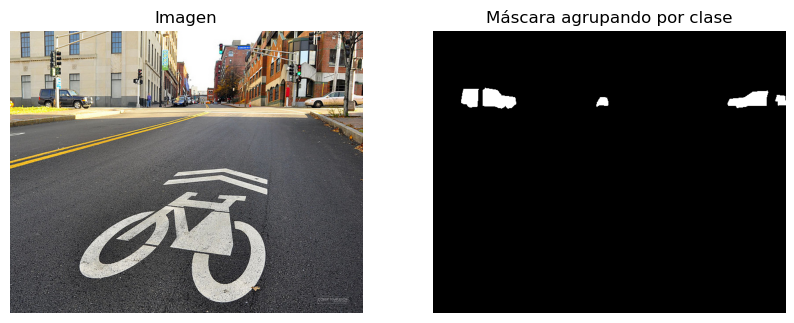

Representando car


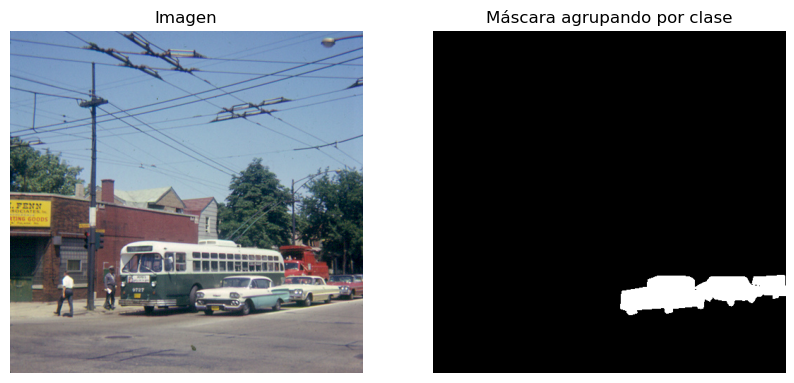

Representando car


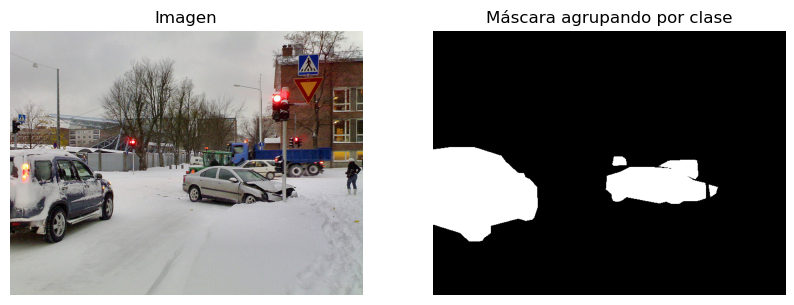

In [83]:
for clase in class_ids:
    for image in img_ids[:3]:
        print(f"Representando {categories[clase]}")
        mask = mask_generator(clase, image, display= True)

Con control de threshold de 200 los resultados parecen medianamente grandes para generar el ground truth, por lo que lo generamos:

In [98]:
image_ids = set()
for cat in top_10_category_ids:
    image_ids |= set(coco.getImgIds(catIds=cat))

image_ids = list(image_ids)


In [101]:
# Se cargan todas las imagenes que contengan alguna de las clases al menos:


final_masks = []

for image_id in image_ids[:3]:

    mascaras = []

    for cat in top_10_category_ids:

        mask = mask_generator(image_id=image_id, class_id= cat, display= False )
        mascaras.append(mask)

    final_masks.append(np.stack(mascaras, axis=-1))



Se genera una función que permita representar si la imagen tiene la máscara bien generada

In [127]:
def plot_image_with_masks(image_id, masks, categories_ids):
    # Load the image
    image_info = coco.loadImgs(image_id)[0]
    img_path = os.path.join(TRAIN_IMAGES_PATH, image_info['file_name'])

    original_image = cv2.imread(img_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Set up the figure
    fig , axs = plt.subplots(3, 4, figsize=(15, 10))
    axs = axs.flatten()  # Flatten the array for easier indexing
    
    # Display the original image
    axs[0].imshow(original_image)
    axs[0].axis('off')
    axs[0].set_title('Image')
    
    # Plot masks
    print(f"We dhave {masks.shape[-1]}, {masks.shape}")
    for idx in range(masks.shape[-1]):
        
        # if idx >= len(axs) - 1:  # Avoid index out-of-range
        #     break

        
        mask = masks[:,:,idx]
        axs[idx + 1].imshow(mask)
        axs[idx + 1].axis('off')
        axs[idx + 1].set_title(f'{categories[categories_ids[idx]]}' if idx < len(categories) else "Unknown")
    

    
    [fig.delaxes(ax) for ax in axs.flatten() if not ax.has_data()]

    plt.tight_layout()
    plt.show()


Image with id 532481
We dhave 10, (426, 640, 10)


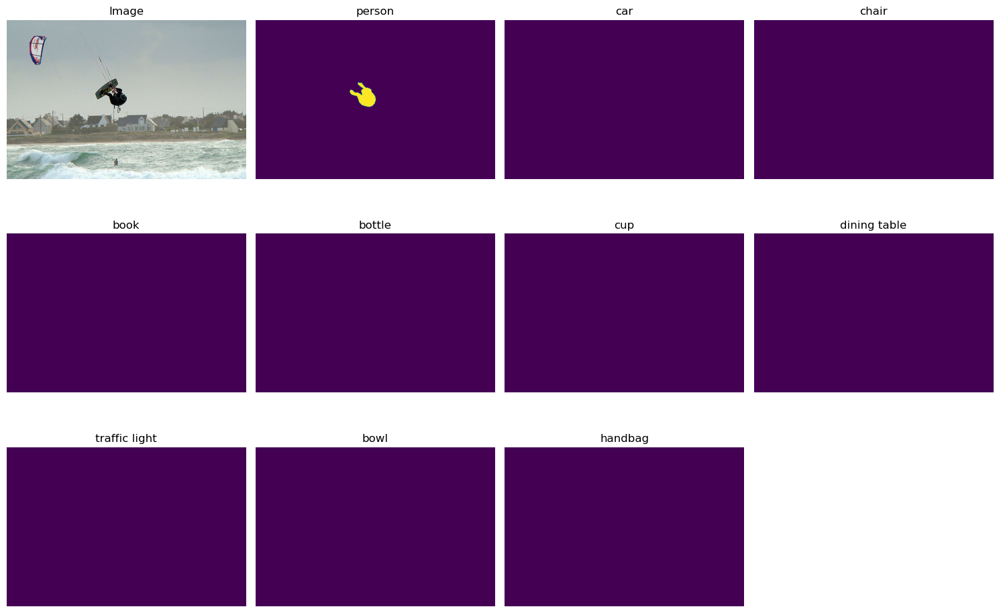

 

Image with id 458755
We dhave 10, (480, 640, 10)


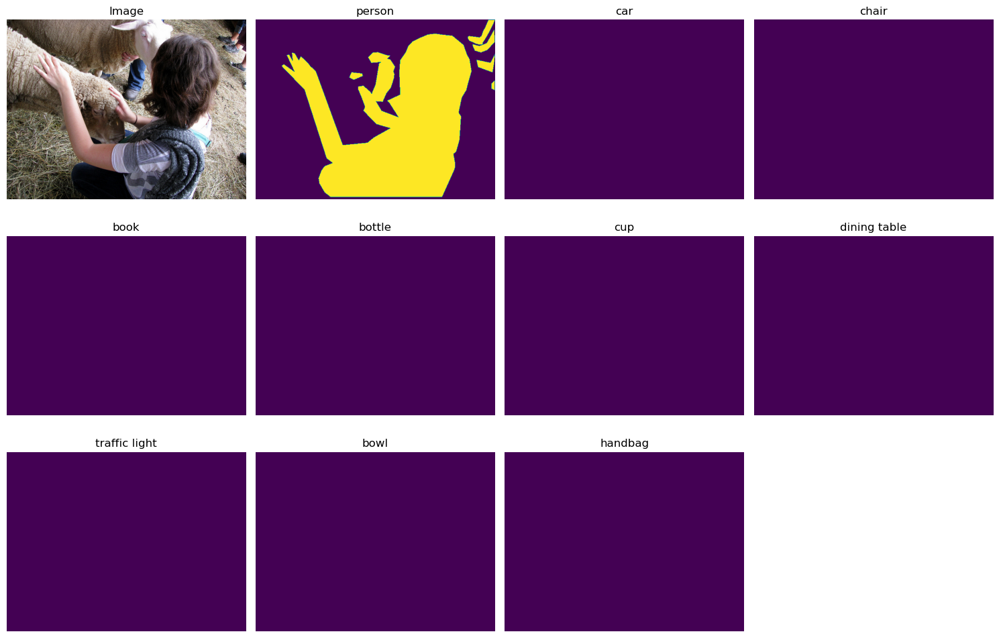

 

Image with id 385029
We dhave 10, (480, 640, 10)


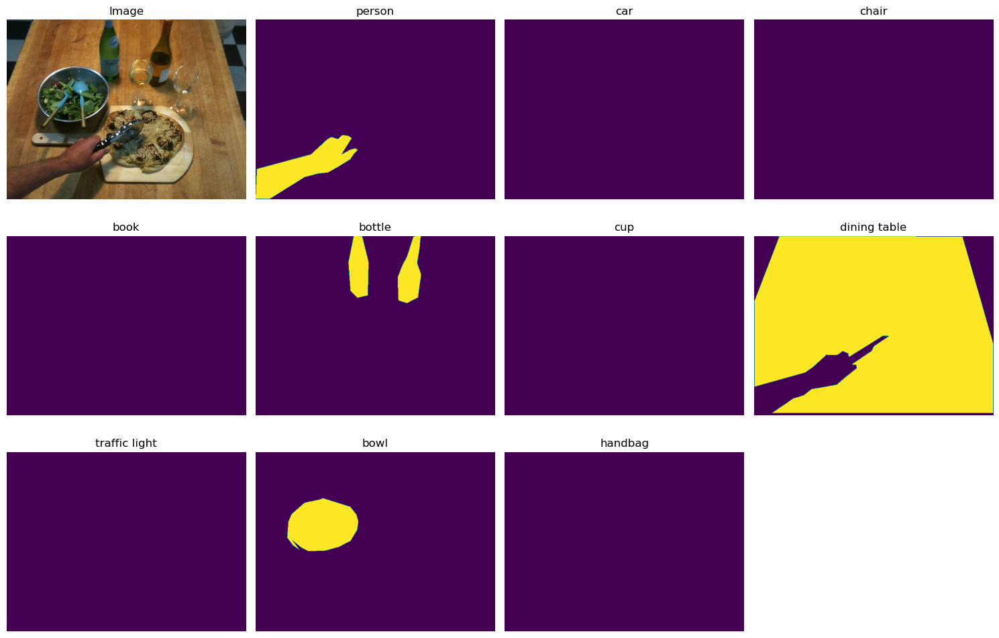

In [128]:
categories_ids = [cat[0] for cat in top_10_categories ]

for image, masks in zip(image_ids[:3],final_masks):



    print("Image with id", image)
    
    plot_image_with_masks(image, masks, categories_ids)
    print(" \n")


In [172]:
#del save_numpy_array

import os


DIR_DATA_PREPROCESSED_TRAIN = os.path.join(
    os.getcwd(), "..", "data", "preprocessed_train")

def save_numpy_array(np_array, nombre):
    """
    Almacena un numpy array n dimensional como.npz.

    Args:
        np_array (np.ndarray): imagen a almacenar.
        nombre (str): nombre del archivo.
    """  

    np_array_image, np_array_mask = np_array[0], np_array[1]

    dir = os.path.join(DIR_DATA_PREPROCESSED_TRAIN, nombre)
      
    # Lo cargamos con el compressed al contener mascaras, dado qeu son datos de caracter repetitivo
    np.savez_compressed(dir, image=np_array_image, mask =np_array_mask )

    return

La generación de las máscaras ha sido la adecuada, por lo que pasamos a automatizar la carga de los np array con sus 10 máscaras a memoria

In [174]:

image_ids = set()
for cat in top_10_category_ids:
    image_ids |= set(coco.getImgIds(catIds=cat))

image_ids = list(image_ids)


final_masks = []

for image_id in image_ids:

    # carga de la imagen
    image_info = coco.loadImgs(image_id)[0]
    img_path = os.path.join(TRAIN_IMAGES_PATH, image_info['file_name'])
    original_image = cv2.imread(img_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    mascaras = []

    # Carga y preprocesamiento de las máscaras

    for cat in top_10_category_ids:

        mask = mask_generator(image_id=image_id, class_id= cat, display= False )
        mascaras.append(mask)

    mascara_imagen = np.stack(mascaras, axis=-1)

    np_array = (original_image,mascara_imagen)
    name = str(image_id)

    save_numpy_array(np_array,name )

    # Almacenamiento de ambas
    #print(f"Imagen  {image_id} almacenada de forma exitosa")



Por último, se comprueba que el almacebnamieto ha sido correcto, cargando del path las primeras n imágenes

Fichero con nombre 188439.npz
We dhave 10, (408, 640, 10)


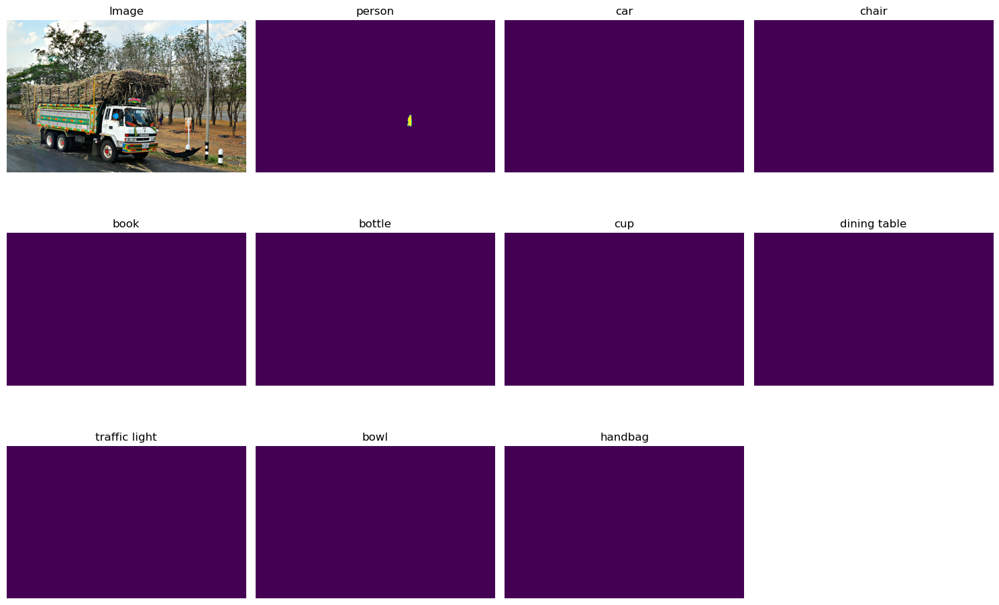

Fichero con nombre 311303.npz
We dhave 10, (427, 640, 10)


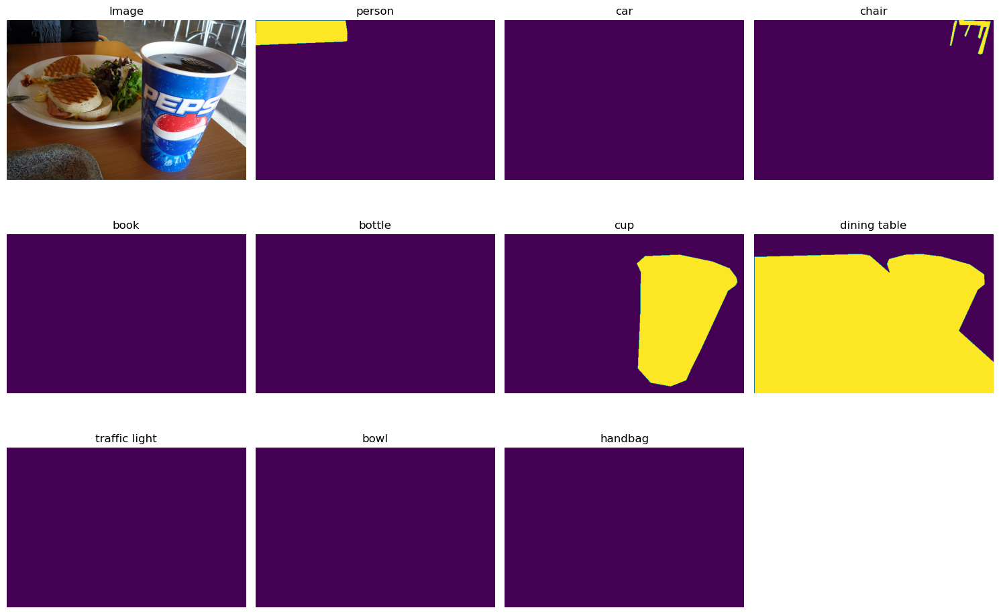

Fichero con nombre 327701.npz
We dhave 10, (428, 640, 10)


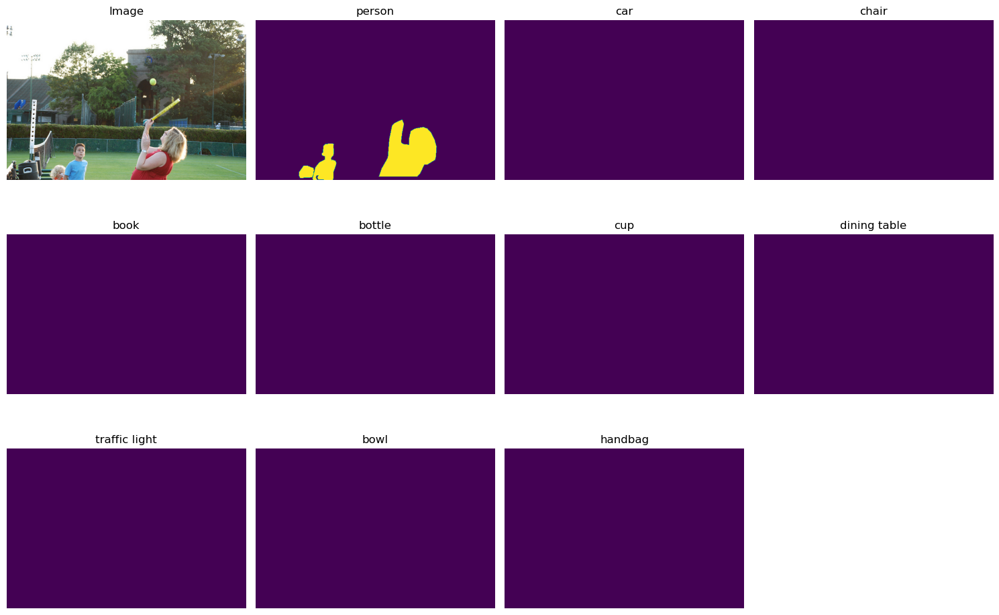

Fichero con nombre 385029.npz
We dhave 10, (480, 640, 10)


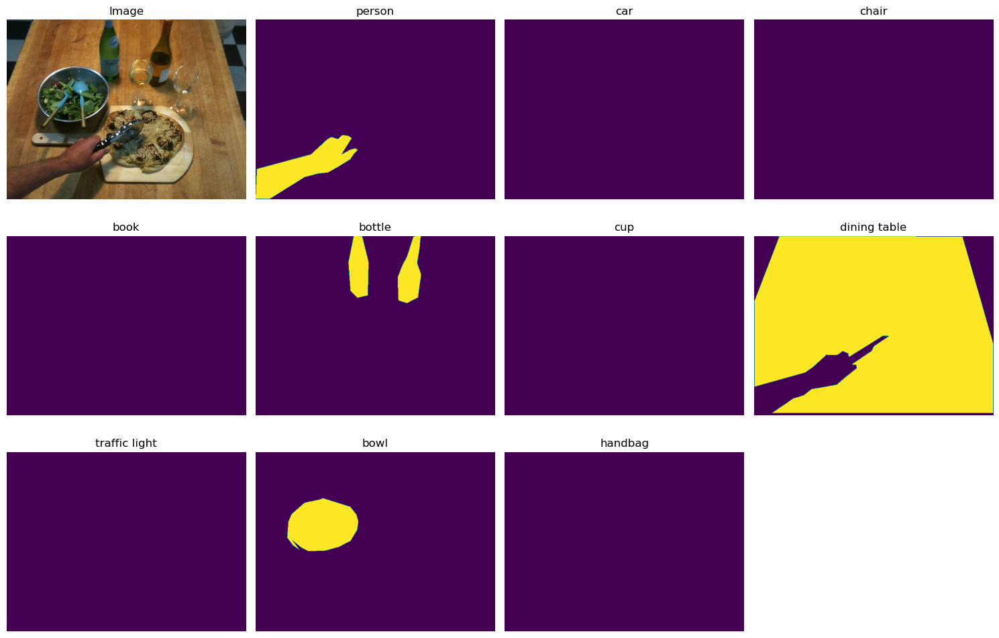

Fichero con nombre 393226.npz
We dhave 10, (480, 640, 10)


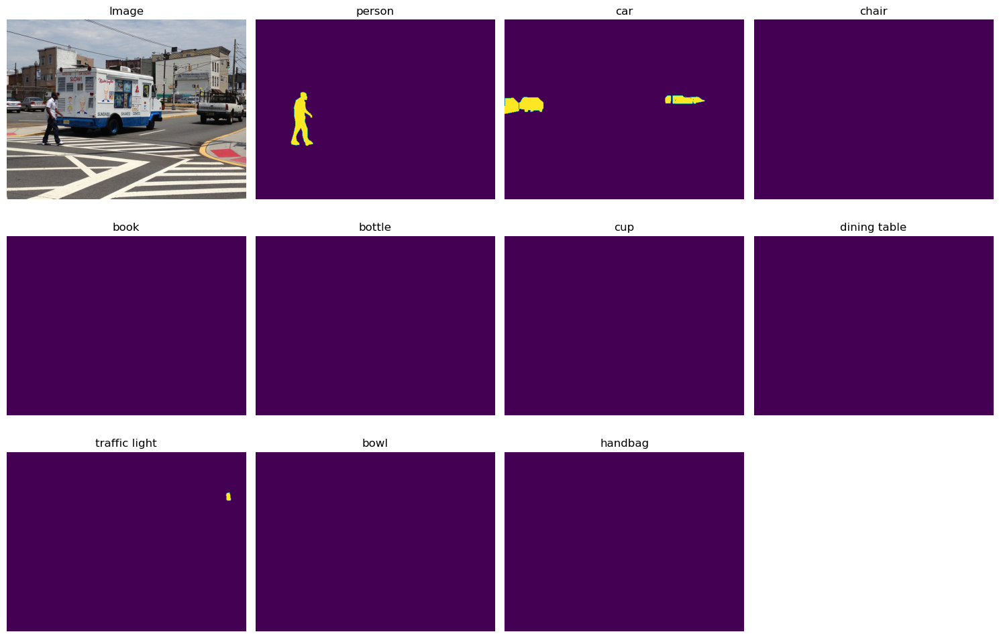

Fichero con nombre 434204.npz
We dhave 10, (333, 500, 10)


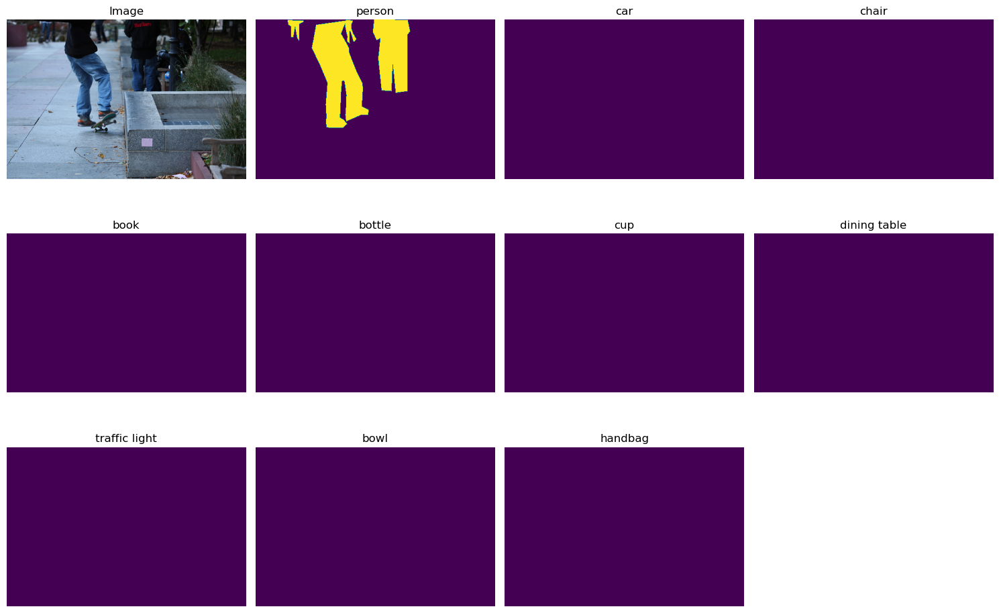

Fichero con nombre 458755.npz
We dhave 10, (480, 640, 10)


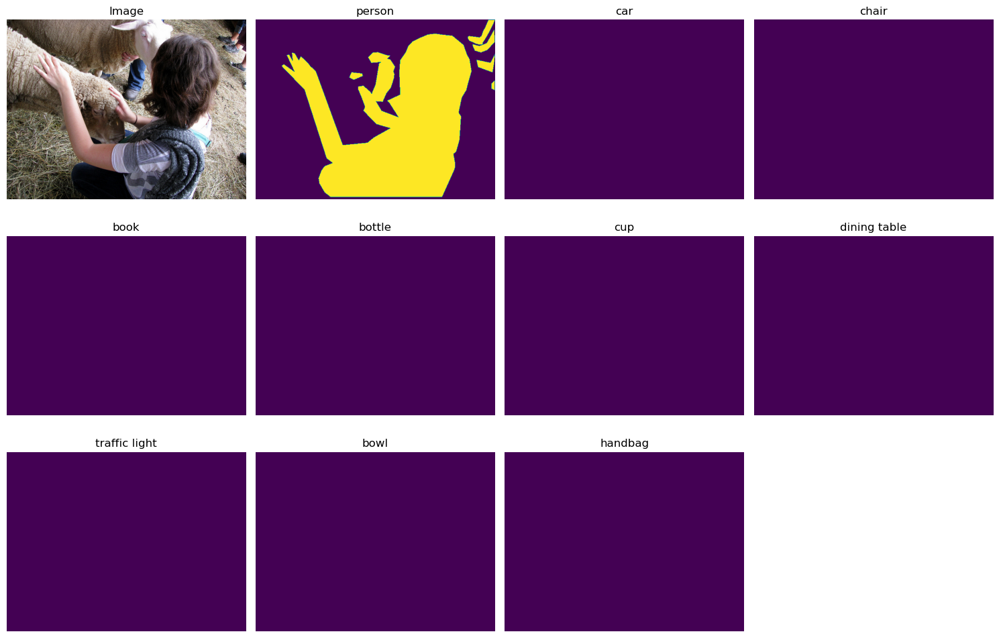

Fichero con nombre 532481.npz
We dhave 10, (426, 640, 10)


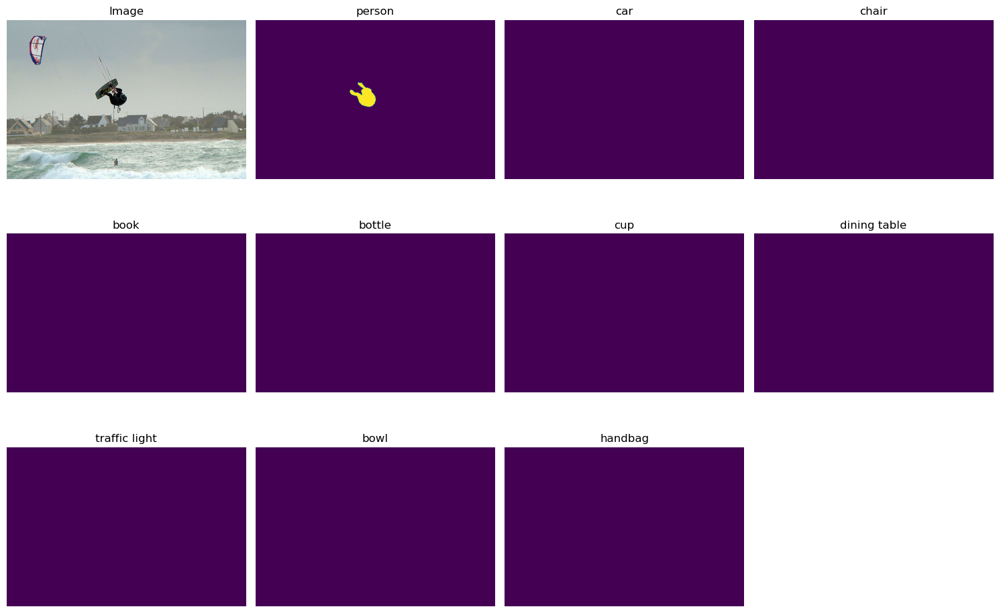

Fichero con nombre 532493.npz
We dhave 10, (408, 640, 10)


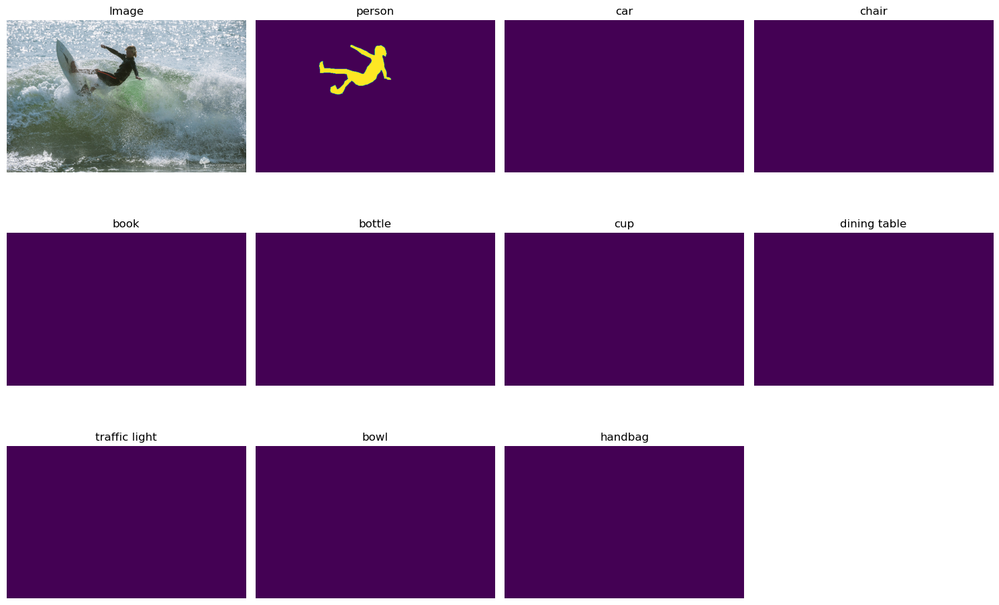

Fichero con nombre 8211.npz
We dhave 10, (459, 640, 10)


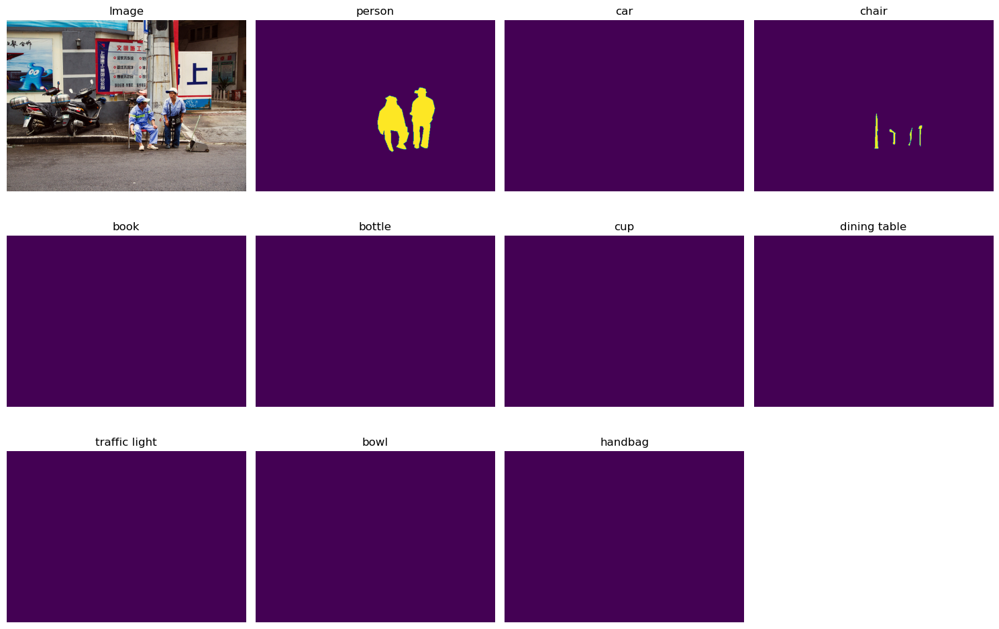

In [ ]:
DIR_DATA_PREPROCESSED_TRAIN = os.path.join(
     os.getcwd(), "..", "data", "preprocessed_train")

for file in os.listdir(DIR_DATA_PREPROCESSED_TRAIN)[:5]:
    print(f"Fichero con nombre", file)
    ruta_imagen = os.path.join(DIR_DATA_PREPROCESSED_TRAIN, file)


    np_array = np.load(ruta_imagen)


    # Set up the figure
    fig , axs = plt.subplots(3, 4, figsize=(15, 10))
    axs = axs.flatten()  # Flatten the array for easier indexing
    
    # Display the original image
    axs[0].imshow(np_array["image"])
    axs[0].axis('off')
    axs[0].set_title('Image')
    
    # Plot masks
    masks = np_array["mask"]
    print(f"We dhave {masks.shape[-1]}, {masks.shape}")
    for idx in range(masks.shape[-1]):
        
        # if idx >= len(axs) - 1:  # Avoid index out-of-range
        #     break

        
        mask = masks[:,:,idx]
        axs[idx + 1].imshow(mask)
        axs[idx + 1].axis('off')
        axs[idx + 1].set_title(f'{categories[categories_ids[idx]]}' if idx < len(categories) else "Unknown")
    

    
    [fig.delaxes(ax) for ax in axs.flatten() if not ax.has_data()]

    plt.tight_layout()
    plt.show()


    